In [2]:
# Import essential libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Set Seaborn style
sns.set(style="whitegrid")

#Load the Dataset in the notebook

df = pd.read_csv(r"C:\Users\Win11\Downloads\archive\Global Superstore.txt", 
                 sep="\t", 
                 encoding='utf-8')
df.head()

,Category,City,Country,Customer ID,Customer Name,Discount,Market,记录数,Order Date,Order ID,...,Sales,Segment,Ship Date,Ship Mode,Shipping Cost,State,Sub-Category,Year,Market2,weeknum
0,Office Supplies,Los Angeles,United States,LS-172304,Lycoris Saunders,0.0,US,1,2011-01-07 00:00:00.000,CA-2011-130813,...,19,Consumer,2011-01-09 00:00:00.000,Second Class,4.37,California,Paper,2011,North America,2
1,Office Supplies,Los Angeles,United States,MV-174854,Mark Van Huff,0.0,US,1,2011-01-21 00:00:00.000,CA-2011-148614,...,19,Consumer,2011-01-26 00:00:00.000,Standard Class,0.94,California,Paper,2011,North America,4
2,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,1,2011-08-05 00:00:00.000,CA-2011-118962,...,21,Consumer,2011-08-09 00:00:00.000,Standard Class,1.81,California,Paper,2011,North America,32
3,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,1,2011-08-05 00:00:00.000,CA-2011-118962,...,111,Consumer,2011-08-09 00:00:00.000,Standard Class,4.59,California,Paper,2011,North America,32
4,Office Supplies,Los Angeles,United States,AP-109154,Arthur Prichep,0.0,US,1,2011-09-29 00:00:00.000,CA-2011-146969,...,6,Consumer,2011-10-03 00:00:00.000,Standard Class,1.32,California,Paper,2011,North America,40


In [9]:
#Basic dataset checks

df.info()
df.describe()
df.isnull().sum()
df.nunique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Category        51290 non-null  object 
 1   City            51290 non-null  object 
 2   Country         51290 non-null  object 
 3   Customer ID     51290 non-null  object 
 4   Customer Name   51290 non-null  object 
 5   Discount        51290 non-null  float64
 6   Market          51290 non-null  object 
 7   è®°å½æ°       51290 non-null  int64  
 8   Order Date      51290 non-null  object 
 9   Order ID        51290 non-null  object 
 10  Order Priority  51290 non-null  object 
 11  Product ID      51290 non-null  object 
 12  Product Name    51290 non-null  object 
 13  Profit          51290 non-null  float64
 14  Quantity        51290 non-null  int64  
 15  Region          51290 non-null  object 
 16  Row ID          51290 non-null  int64  
 17  Sales           51290 non-null 

Category              3
City               3636
Country             147
Customer ID        4873
Customer Name       795
Discount             27
Market                7
è®°å½æ°             1
Order Date         1430
Order ID          25035
Order Priority        4
Product ID        10292
Product Name       3788
Profit            24575
Quantity             14
Region               13
Row ID            51290
Sales              2246
Segment               3
Ship Date          1464
Ship Mode             4
Shipping Cost     16877
State              1094
Sub-Category         17
Year                  4
Market2               6
weeknum              53
dtype: int64

In [10]:
#Rename Columns for Clean Consistency

df.columns = df.columns.str.lower().str.replace(" ", "_")

In [11]:
#Convert Dates & Data Types

df['order_date'] = pd.to_datetime(df['order_date'])
df['ship_date'] = pd.to_datetime(df['ship_date'])


In [12]:
#Check numeric columns

numeric_cols = ['sales', 'profit', 'quantity', 'discount']
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric)

In [13]:
#Exploratory Data Analysis

# Sales by region
df.groupby('region')['sales'].sum().sort_values(ascending=False)


region
Central           2822399
South             1600960
North             1248192
Oceania           1100207
Southeast Asia     884438
North Asia         848349
EMEA               806184
Africa             783776
Central Asia       752839
West               725514
East               678834
Caribbean          324281
Canada              66932
Name: sales, dtype: int64

In [14]:
# Profit by product category
df.groupby('category')['profit'].sum().sort_values(ascending=False)

category
Technology         663778.73318
Office Supplies    518473.83430
Furniture          285204.72380
Name: profit, dtype: float64

<Axes: xlabel='order_date'>

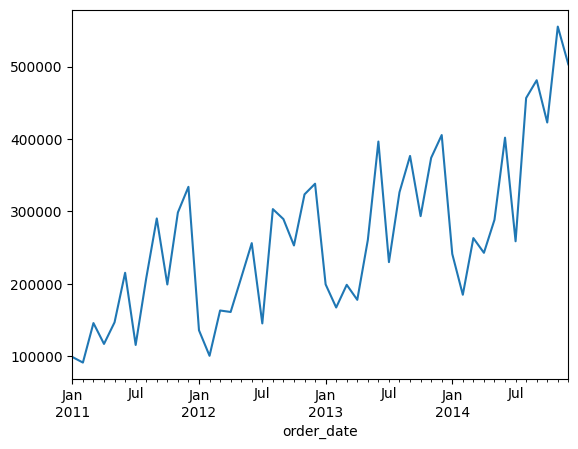

In [15]:
# Monthly trend
df.groupby(df['order_date'].dt.to_period('M'))['sales'].sum().plot(kind='line')

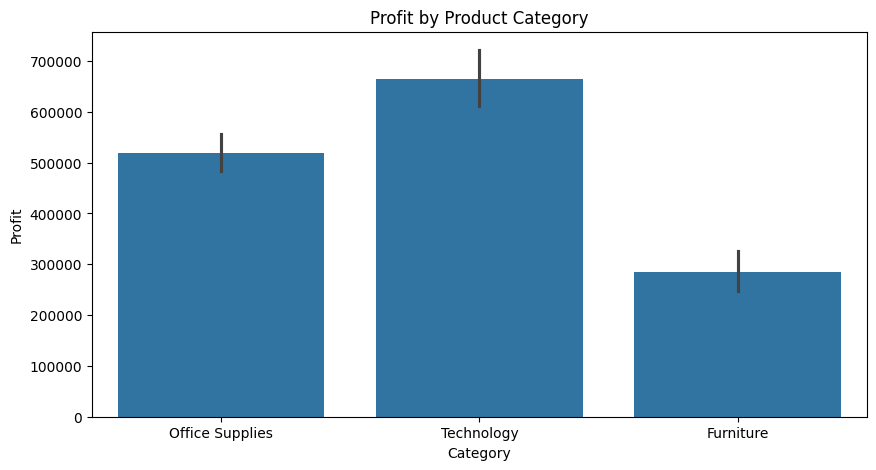

In [29]:
#Visualization

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.barplot(x='Category', y='Profit', data=df, estimator=sum)
plt.title("Profit by Product Category")
plt.show()

Univariate Analysis

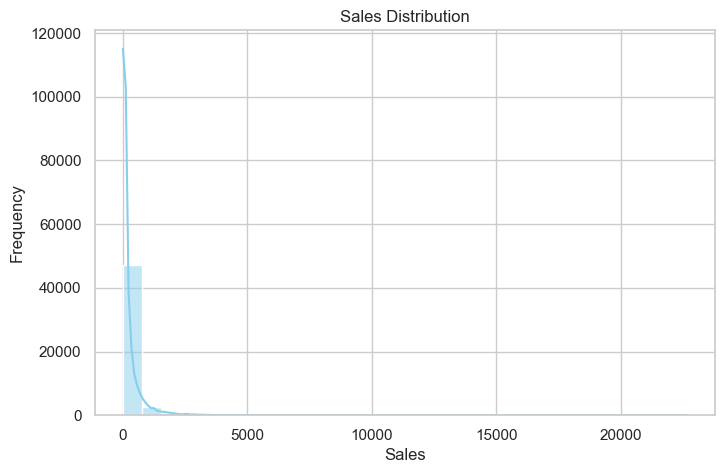

In [3]:
# Histogram for Sales

plt.figure(figsize=(8,5))
sns.histplot(df['Sales'], bins=30, kde=True, color='skyblue')
plt.title('Sales Distribution')
plt.xlabel('Sales')
plt.ylabel('Frequency')
plt.show()

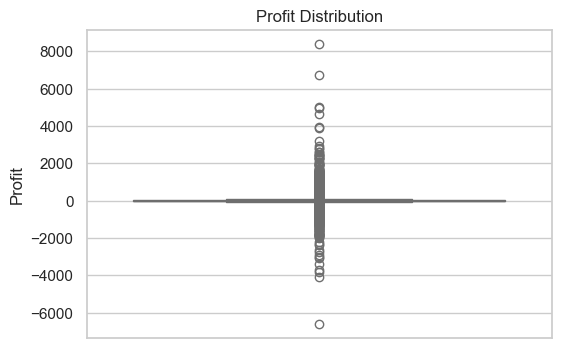

In [4]:
# Boxplot for Profit

plt.figure(figsize=(6,4))
sns.boxplot(y=df['Profit'], color='lightcoral')
plt.title('Profit Distribution')
plt.ylabel('Profit')
plt.show()

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\7979114.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Ship Mode', data=df, palette='Set2')


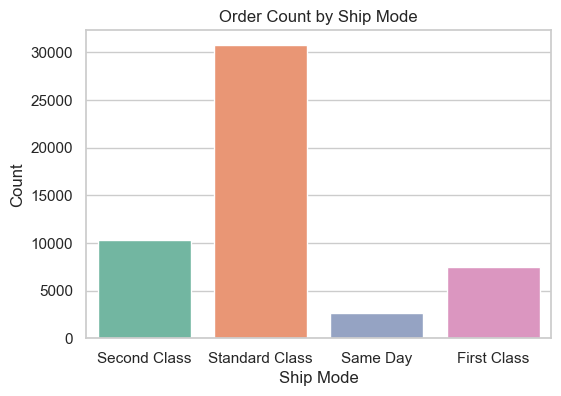

In [7]:
# Countplot for Ship Mode

plt.figure(figsize=(6,4))
sns.countplot(x='Ship Mode', data=df, palette='Set2')
plt.title('Order Count by Ship Mode')
plt.xlabel('Ship Mode')
plt.ylabel('Count')
plt.show()

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\3376413825.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Category', data=df, palette='muted')


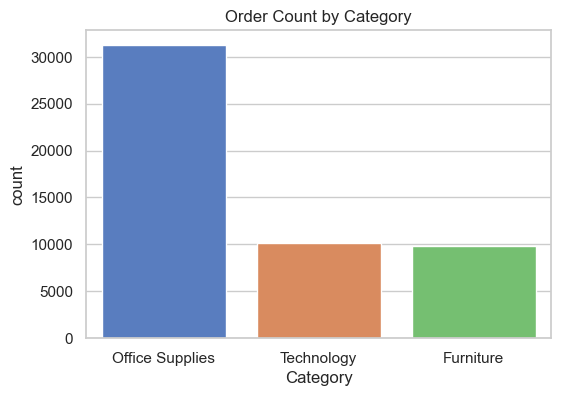

In [8]:
# Bar chart for Category

plt.figure(figsize=(6,4))
sns.countplot(x='Category', data=df, palette='muted')
plt.title('Order Count by Category')
plt.show()

Bivariate Analysis

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\2525539595.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Category', y='Sales', data=df, estimator=sum, palette='pastel')


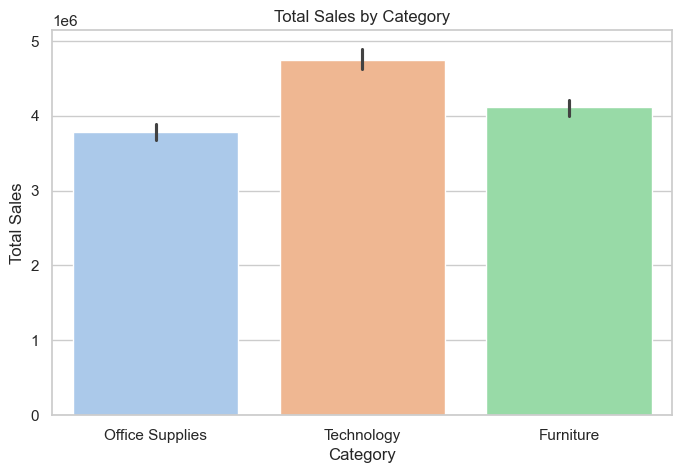

In [9]:
# Sales by Category

plt.figure(figsize=(8,5))
sns.barplot(x='Category', y='Sales', data=df, estimator=sum, palette='pastel')
plt.title('Total Sales by Category')
plt.ylabel('Total Sales')
plt.show()

In [11]:
df['Region'] = df['Region'].str.strip()

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\2003076080.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Region', y='Profit', estimator=sum, data=df, palette='coolwarm')


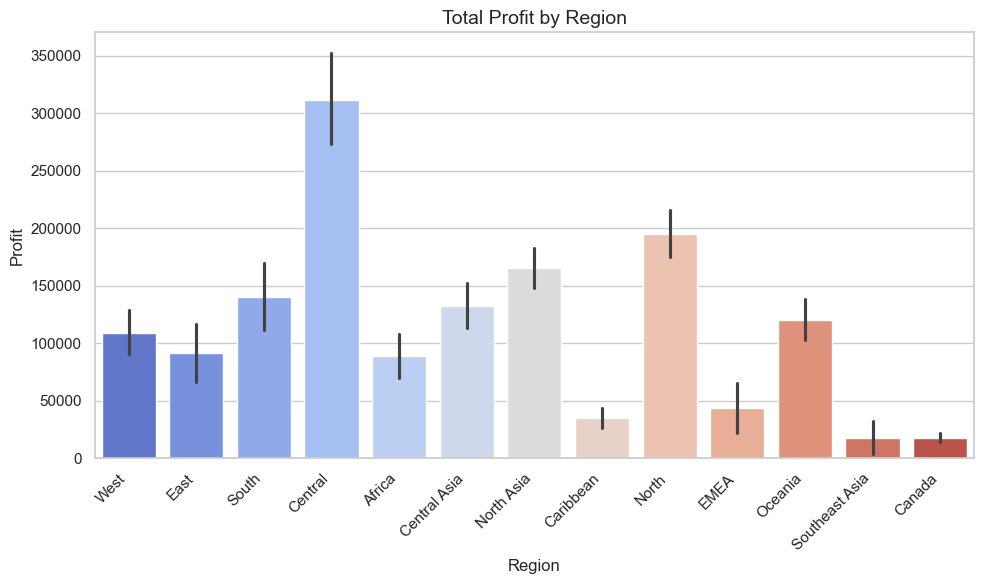

In [13]:
# Profit by Region

plt.figure(figsize=(10,6))
sns.barplot(x='Region', y='Profit', estimator=sum, data=df, palette='coolwarm')
plt.title('Total Profit by Region', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

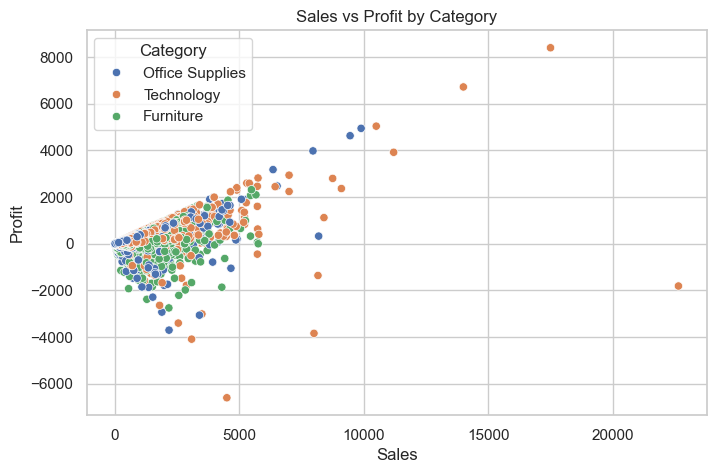

In [14]:
# Scatter Plot: Sales vs Profit

plt.figure(figsize=(8,5))
sns.scatterplot(x='Sales', y='Profit', data=df, hue='Category', palette='deep')
plt.title('Sales vs Profit by Category')
plt.xlabel('Sales')
plt.ylabel('Profit')
plt.show()

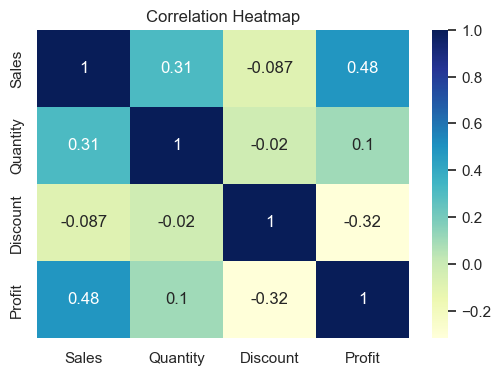

In [15]:
# Correlation Heatmap
plt.figure(figsize=(6,4))
sns.heatmap(df[['Sales','Quantity','Discount','Profit']].corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Heatmap')
plt.show()

Multivariate Analysis

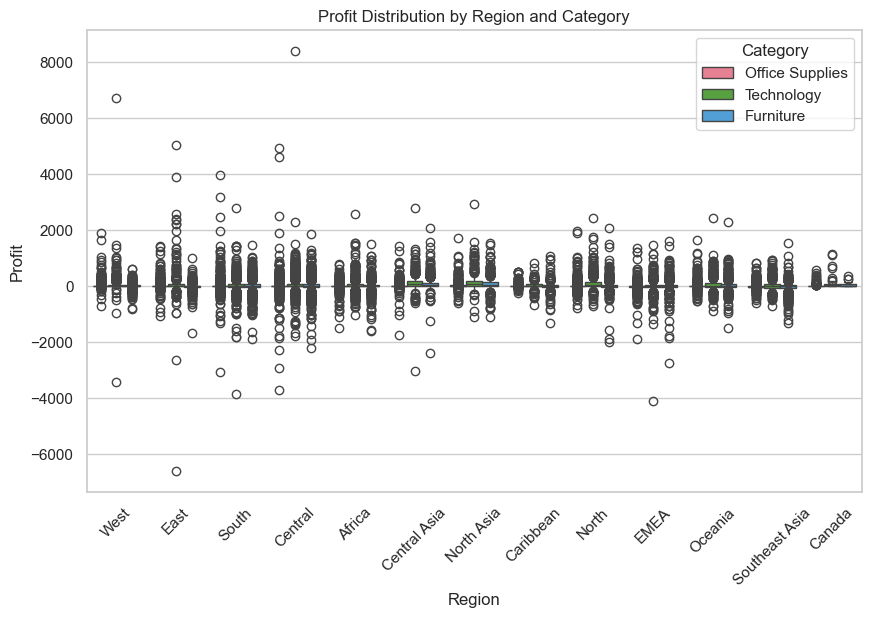

In [16]:
# Category vs Region vs Profit (boxplot)

plt.figure(figsize=(10,6))
sns.boxplot(x='Region', y='Profit', hue='Category', data=df, palette='husl')
plt.title('Profit Distribution by Region and Category')
plt.xticks(rotation=45)
plt.show()

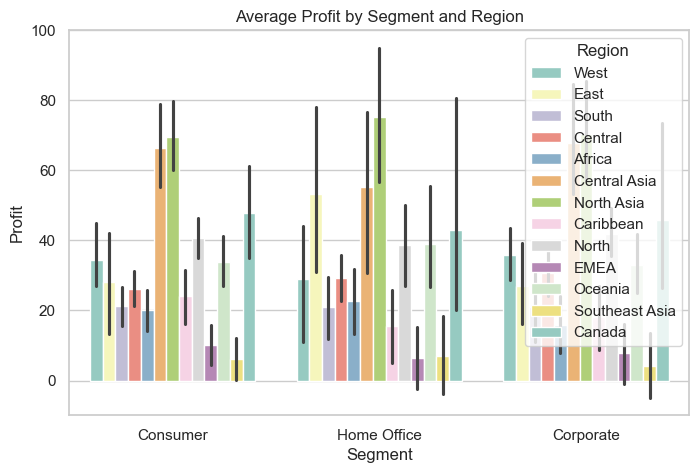

In [17]:
# Average Profit by Segment and Region

plt.figure(figsize=(8,5))
sns.barplot(x='Segment', y='Profit', hue='Region', data=df, estimator=np.mean, palette='Set3')
plt.title('Average Profit by Segment and Region')
plt.show()

Interactive Visualizations

C:\Users\Win11\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


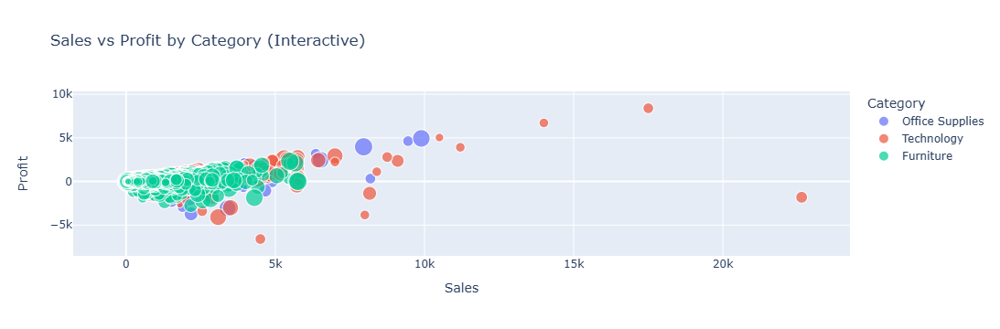

In [18]:
# Interactive Sales vs Profit Scatter

fig = px.scatter(df, x='Sales', y='Profit', color='Category', size='Quantity',
                 hover_data=['Region', 'Segment'],
                 title='Sales vs Profit by Category (Interactive)')
fig.show()

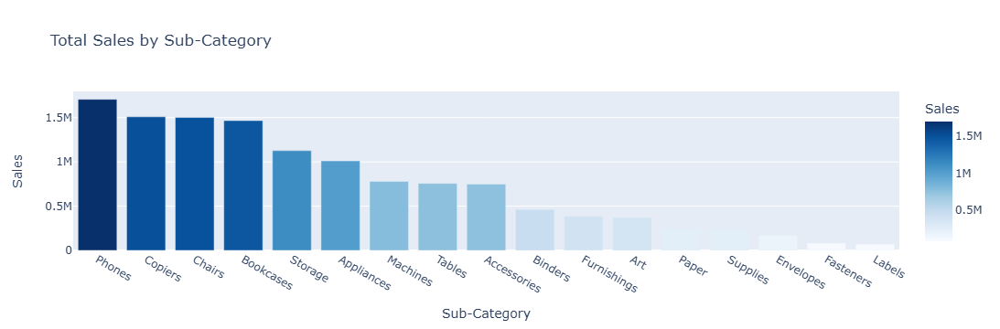

In [19]:
# Interactive Bar: Sales by Sub-Category

sub_sales = df.groupby('Sub-Category')['Sales'].sum().reset_index().sort_values(by='Sales', ascending=False)
fig = px.bar(sub_sales, x='Sub-Category', y='Sales', color='Sales',
             title='Total Sales by Sub-Category', color_continuous_scale='Blues')
fig.show()

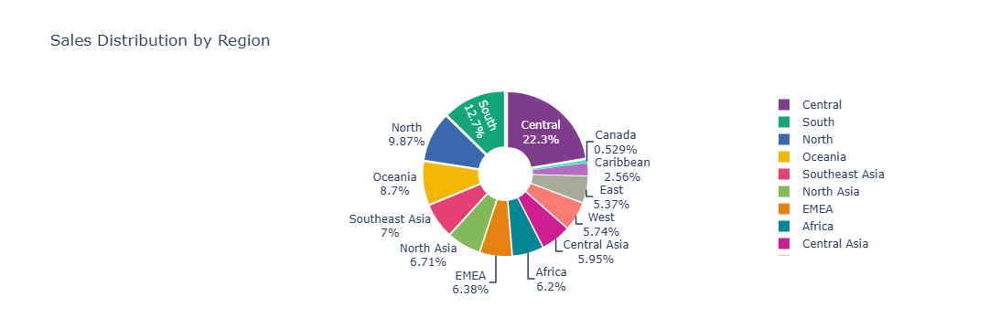

In [22]:
# Interactive Pie: Market Share by Region

import plotly.express as px

sales_region = df.groupby('Region')['Sales'].sum().reset_index()
fig = px.pie(
    sales_region,
    values='Sales',
    names='Region',
    title='Sales Distribution by Region',
    color_discrete_sequence=px.colors.qualitative.Bold,
    hole=0.3
)
fig.update_traces(textinfo='percent+label', pull=[0.05]*len(sales_region))
fig.show()


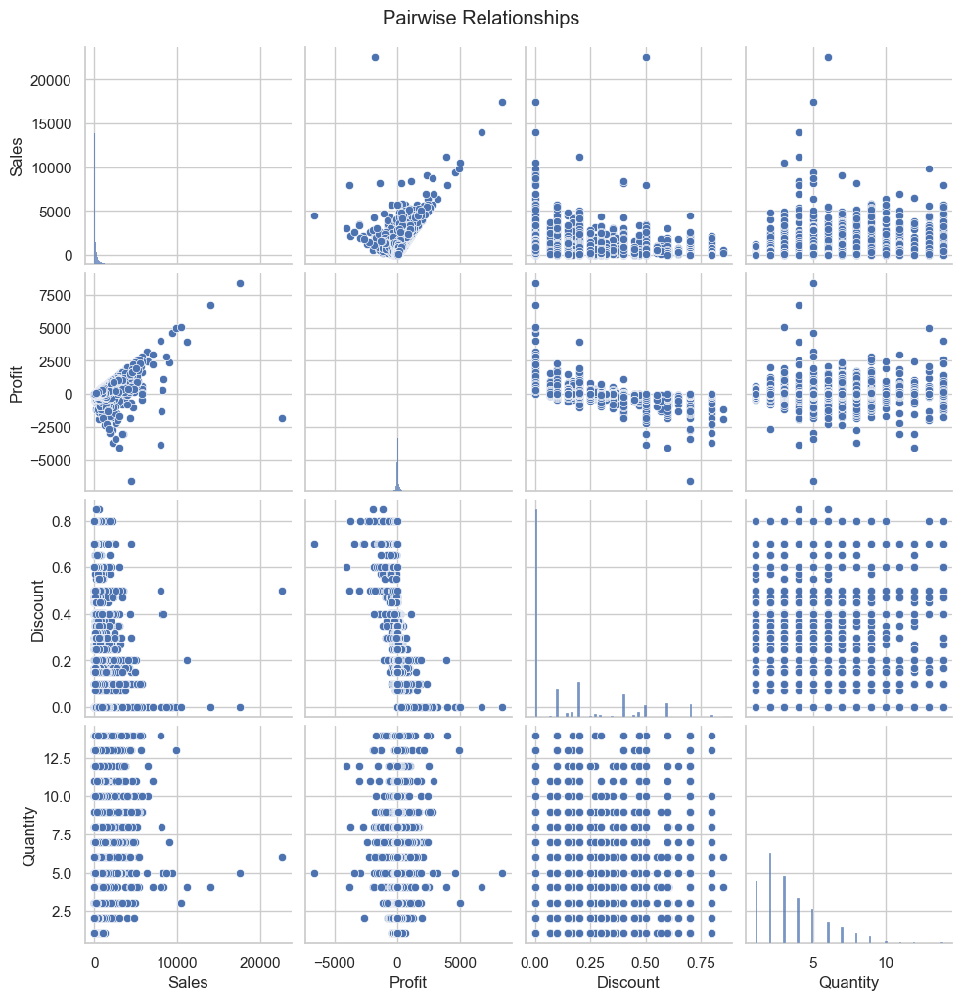

In [23]:
# Pairplot for numerical features

sns.pairplot(df[['Sales', 'Profit', 'Discount', 'Quantity']])
plt.suptitle('Pairwise Relationships', y=1.02)
plt.show()

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\4267054104.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




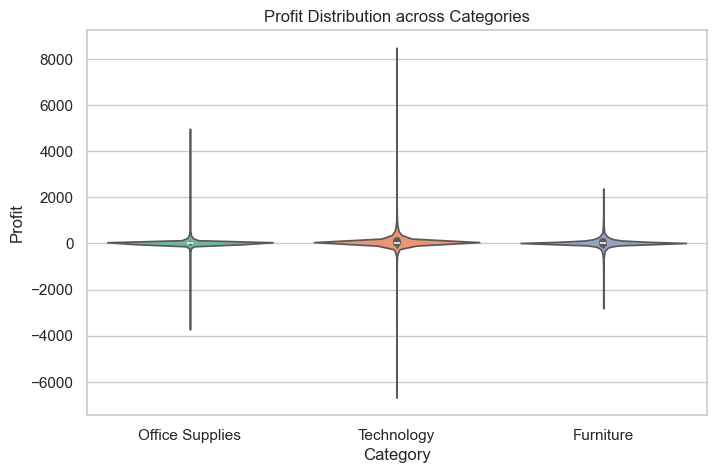

In [24]:
# Distribution of Profit by Category

plt.figure(figsize=(8,5))
sns.violinplot(x='Category', y='Profit', data=df, palette='Set2')
plt.title('Profit Distribution across Categories')
plt.show()

Time Series Visualization

In [25]:
# Convert Order Date column to datetime
df['Order Date'] = pd.to_datetime(df['Order Date'], errors='coerce')

# Check if conversion worked
df['Order Date'].head()

# Extract time-based features
df['Year'] = df['Order Date'].dt.year
df['Month'] = df['Order Date'].dt.month_name()
df['Month_Num'] = df['Order Date'].dt.month
df['Quarter'] = df['Order Date'].dt.to_period('Q')
df['Weekday'] = df['Order Date'].dt.day_name()


In [26]:
#Sales and Profit Over Time (Line Trends)

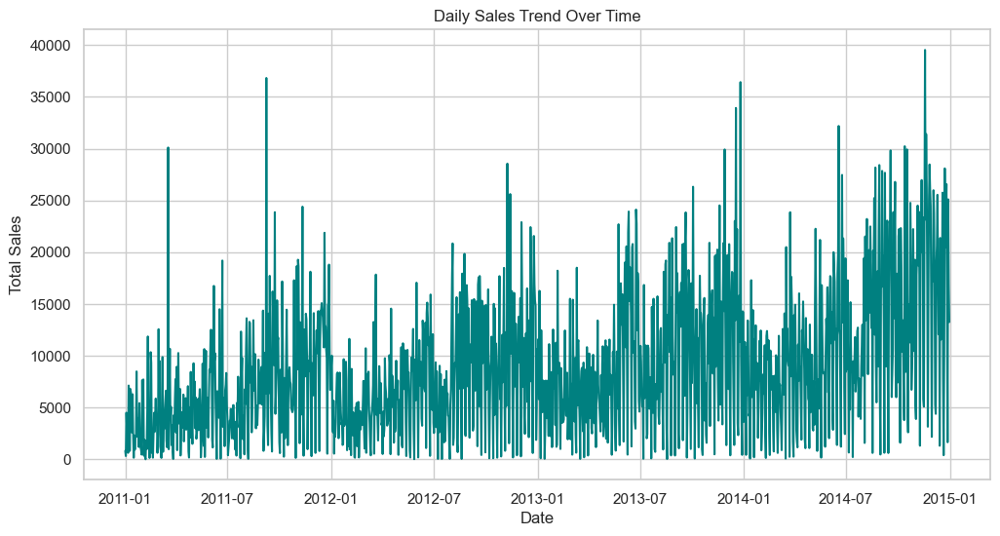

In [27]:
# Daily Sales trend
daily_sales = df.groupby('Order Date')['Sales'].sum().reset_index()

plt.figure(figsize=(12,6))
sns.lineplot(x='Order Date', y='Sales', data=daily_sales, color='teal')
plt.title('Daily Sales Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()

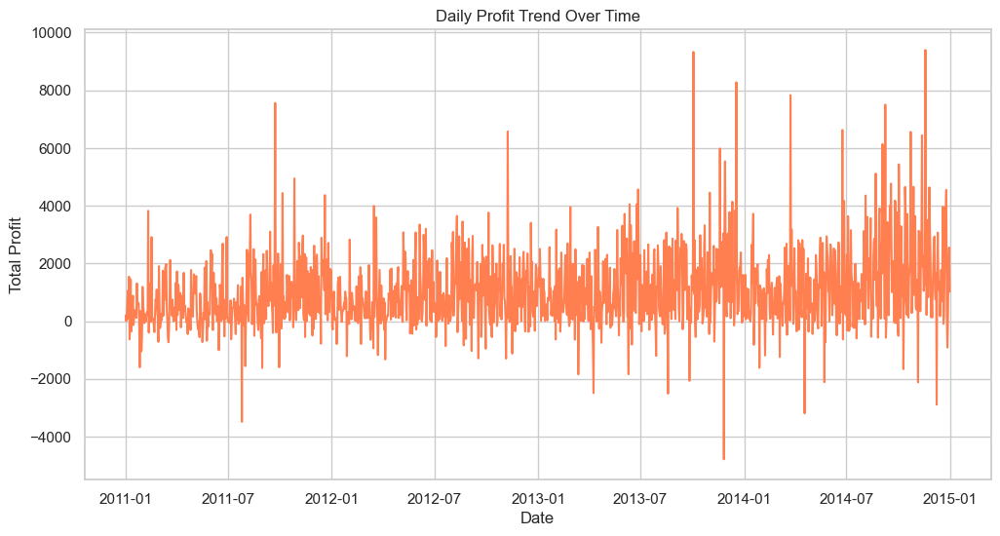

In [28]:
# Daily Profit trend
daily_profit = df.groupby('Order Date')['Profit'].sum().reset_index()

plt.figure(figsize=(12,6))
sns.lineplot(x='Order Date', y='Profit', data=daily_profit, color='coral')
plt.title('Daily Profit Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Total Profit')
plt.show()

In [29]:
#Monthly Sales and Profit Trends

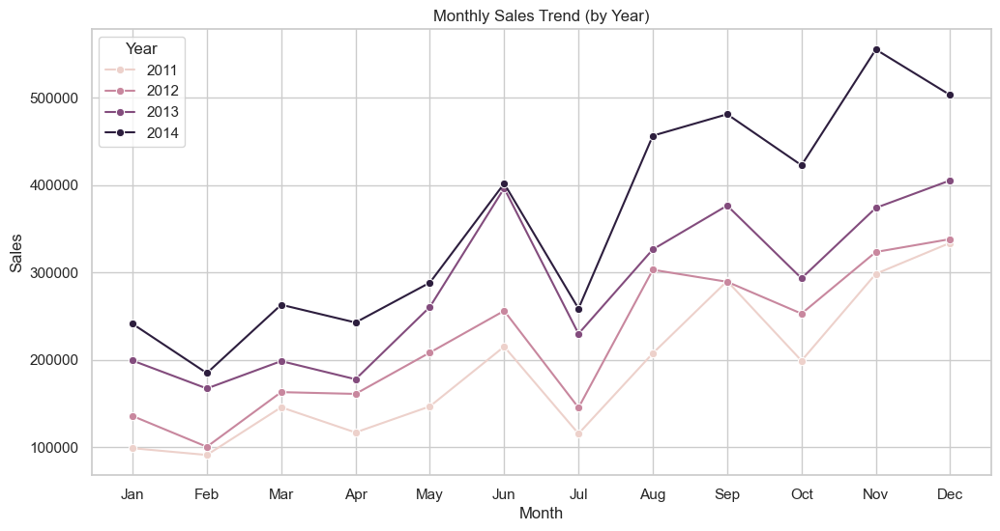

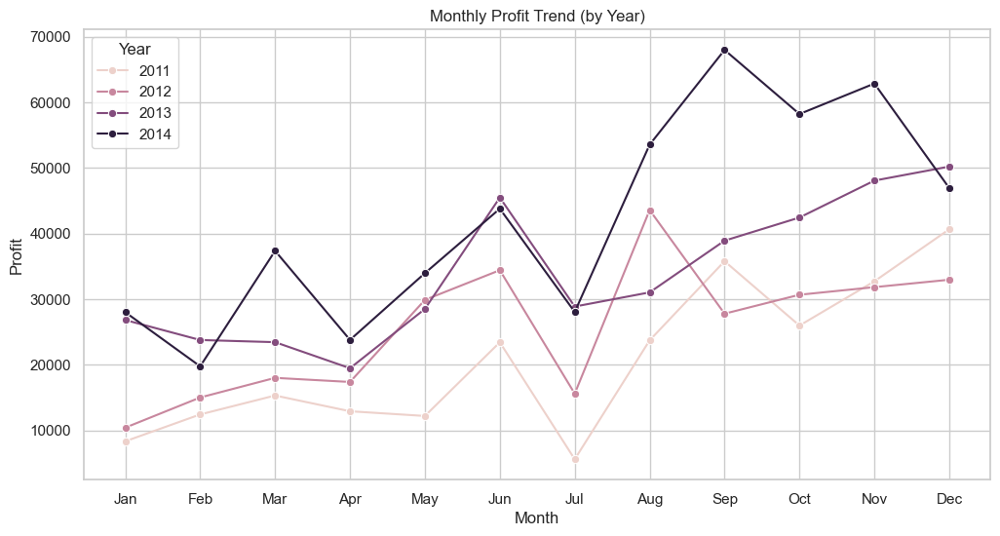

In [30]:
# Group by Year and Month
monthly_data = df.groupby(['Year','Month_Num'])[['Sales','Profit']].sum().reset_index()

# Sort by year/month
monthly_data = monthly_data.sort_values(['Year','Month_Num'])

plt.figure(figsize=(12,6))
sns.lineplot(x='Month_Num', y='Sales', hue='Year', data=monthly_data, marker='o')
plt.title('Monthly Sales Trend (by Year)')
plt.xlabel('Month')
plt.ylabel('Sales')
plt.xticks(ticks=range(1,13), labels=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.show()

plt.figure(figsize=(12,6))
sns.lineplot(x='Month_Num', y='Profit', hue='Year', data=monthly_data, marker='o')
plt.title('Monthly Profit Trend (by Year)')
plt.xlabel('Month')
plt.ylabel('Profit')
plt.xticks(ticks=range(1,13), labels=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.show()


In [31]:
#Yearly Sales Comparison

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\1639456413.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




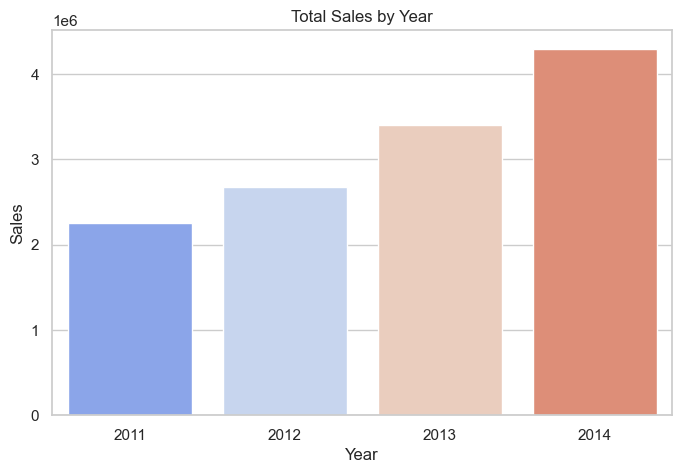

In [32]:
# Total sales by year
yearly_sales = df.groupby('Year')['Sales'].sum().reset_index()

plt.figure(figsize=(8,5))
sns.barplot(x='Year', y='Sales', data=yearly_sales, palette='coolwarm')
plt.title('Total Sales by Year')
plt.ylabel('Sales')
plt.show()

In [33]:
#Seasonal Pattern — Sales by Month and Category

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\590083062.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




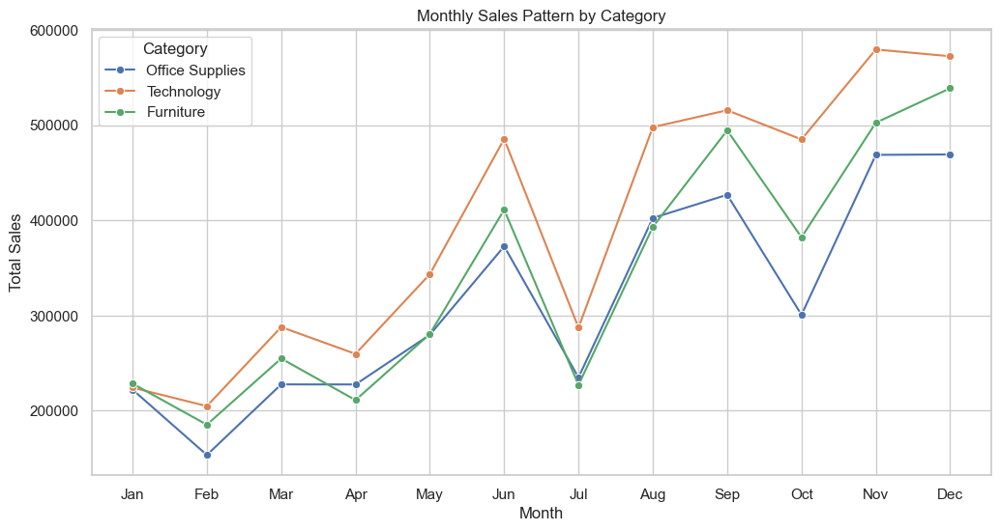

In [34]:
# Monthly pattern by Category
plt.figure(figsize=(12,6))
sns.lineplot(x='Month_Num', y='Sales', hue='Category', data=df, estimator='sum', ci=None, marker='o')
plt.title('Monthly Sales Pattern by Category')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.xticks(ticks=range(1,13), labels=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.show()

In [35]:
#Interactive Time-Series with Plotly

C:\Users\Win11\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



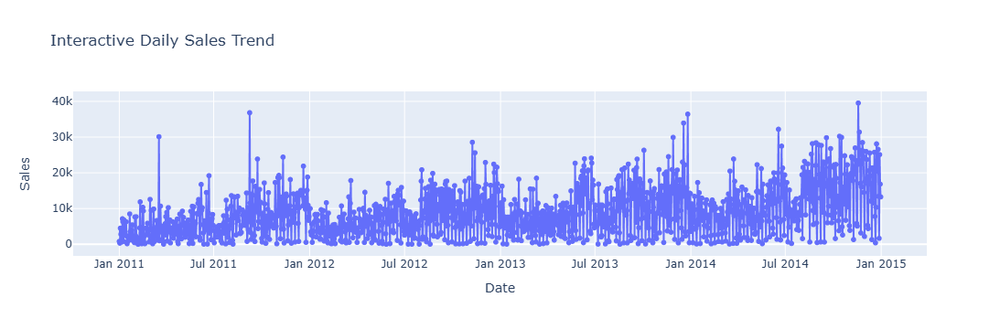

C:\Users\Win11\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



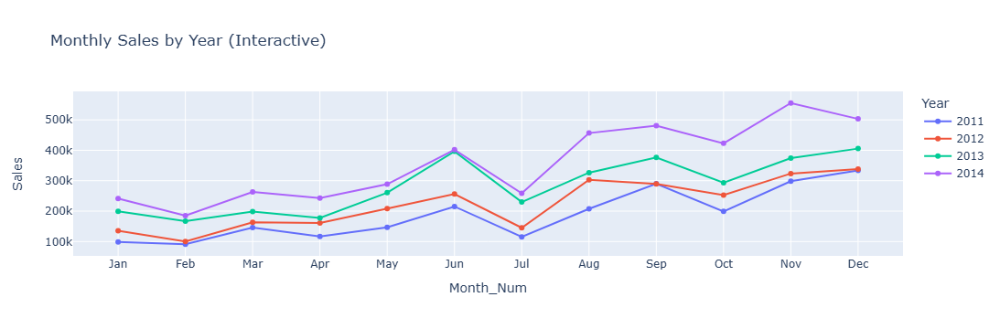

In [36]:
# Interactive Sales over Time
fig = px.line(daily_sales, x='Order Date', y='Sales',
              title='Interactive Daily Sales Trend', 
              markers=True)
fig.update_layout(xaxis_title='Date', yaxis_title='Sales')
fig.show()

# Interactive Monthly Trend by Year
fig = px.line(monthly_data, x='Month_Num', y='Sales', color='Year', 
              title='Monthly Sales by Year (Interactive)',
              markers=True)
fig.update_xaxes(tickvals=list(range(1,13)),
                 ticktext=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
fig.show()


In [37]:
#Forecasting Preparation (Feature Engineering)

C:\Users\Win11\AppData\Local\Temp\ipykernel_6276\551444731.py:2: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



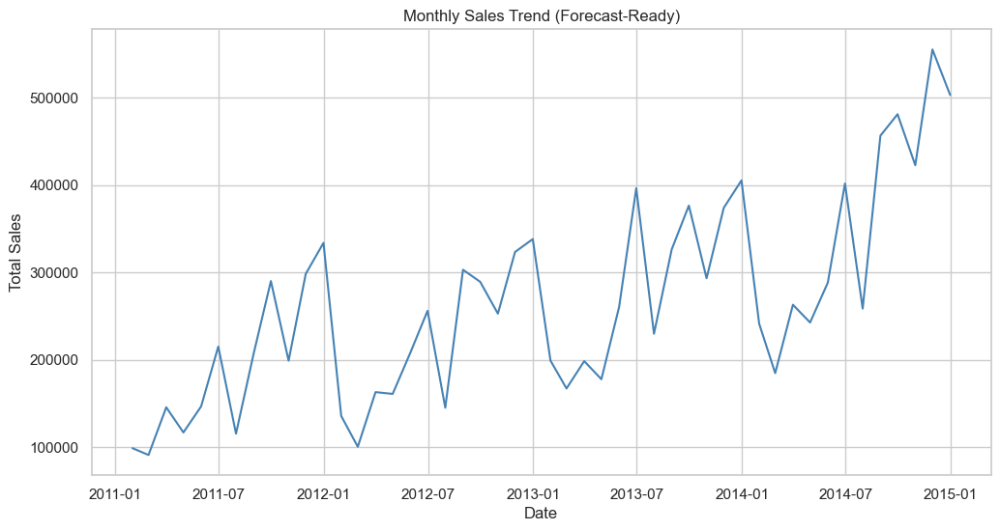

In [38]:
# Create a monthly aggregated dataset
monthly_sales_forecast = df.groupby(pd.Grouper(key='Order Date', freq='M'))['Sales'].sum().reset_index()

# Rename columns
monthly_sales_forecast.columns = ['Date','Sales']

# Preview
monthly_sales_forecast.tail()

# Plot clean trend
plt.figure(figsize=(12,6))
sns.lineplot(x='Date', y='Sales', data=monthly_sales_forecast, color='steelblue')
plt.title('Monthly Sales Trend (Forecast-Ready)')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()